In [717]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import date
import calendar
import operator

from datetime import datetime, timedelta


import spacy
import re
from functools import reduce
from collections import Counter
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer

from sklearn.metrics.pairwise import cosine_similarity

from sklearn import ensemble

from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

pd.set_option('display.max_rows', 5000)

In [718]:
# Import data
data = pd.read_csv(r'C:\Users\shaba\Online Retail.csv')

data['InvoiceDate'] = pd.to_datetime(data['InvoiceDate'])

# Add a revenue column, multiplying quanity and unit price. Also exclude returns and focus on sales only
data = data.loc[(data['Quantity'] >0) & (data['UnitPrice'] >0)]
data["Revenue"] = data['Quantity'] * data['UnitPrice']

# Add several views of the date information, Day of Week, Hour, etc.
data['Day of Week'] = data["InvoiceDate"].dt.weekday_name
data['Week of Year'] = data["InvoiceDate"].dt.weekofyear
data['Week of Year'] = data["InvoiceDate"].dt.weekofyear
data['Month'] = data["InvoiceDate"].dt.month
data['Hour'] = data["InvoiceDate"].dt.hour
data['Year'] = data["InvoiceDate"].dt.year
data['Day of Week Number'] = data['InvoiceDate'].dt.weekday

In [719]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Day of Week,Week of Year,Month,Hour,Year,Day of Week Number
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,Wednesday,48,12,8,2010,2
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,Wednesday,48,12,8,2010,2
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2


In [720]:
nlp_start_data = data["Description"].drop_duplicates()
nlp_doc_data = data["Description"]

In [721]:
nlp_doc_data.shape

(530104,)

In [722]:
type(nlp_start_data)

pandas.core.series.Series

In [723]:
len(nlp_start_data)

4026

In [724]:
nlp_start_data.head(4100)

0          WHITE HANGING HEART T-LIGHT HOLDER
1                         WHITE METAL LANTERN
2              CREAM CUPID HEARTS COAT HANGER
3         KNITTED UNION FLAG HOT WATER BOTTLE
4              RED WOOLLY HOTTIE WHITE HEART.
5                SET 7 BABUSHKA NESTING BOXES
6           GLASS STAR FROSTED T-LIGHT HOLDER
7                      HAND WARMER UNION JACK
8                   HAND WARMER RED POLKA DOT
9               ASSORTED COLOUR BIRD ORNAMENT
10                 POPPY'S PLAYHOUSE BEDROOM 
11                  POPPY'S PLAYHOUSE KITCHEN
12          FELTCRAFT PRINCESS CHARLOTTE DOLL
13                    IVORY KNITTED MUG COSY 
14         BOX OF 6 ASSORTED COLOUR TEASPOONS
15              BOX OF VINTAGE JIGSAW BLOCKS 
16             BOX OF VINTAGE ALPHABET BLOCKS
17                   HOME BUILDING BLOCK WORD
18                   LOVE BUILDING BLOCK WORD
19                RECIPE BOX WITH METAL HEART
20                        DOORMAT NEW ENGLAND
21                   JAM MAKING SE

In [725]:
def text_cleaner(text):
    text = text.apply(lambda x:re.sub("\.", "", x))
    text = text.apply(lambda x:re.sub("\,", " ", x))
    text = text.apply(lambda x:re.sub("-", " ", x))
    text = text.apply(lambda x:re.sub("'","",x)) 
    text = text.apply(lambda x:re.sub("\"","",x)) 
    text = text.apply(lambda x:re.sub("  "," ",x)) 
    text = text.apply(lambda x:re.sub("\\\\","",x))  
    text = text.apply(lambda x:re.sub("/"," ",x))  
    text = text.apply(lambda x:re.sub("-", " ", x))
    text = text.apply(lambda x:re.sub("\+", " ", x))
    return text
cleaned_text=text_cleaner(nlp_start_data)
cleaned_document = text_cleaner(nlp_doc_data )

In [726]:
description_column =data["Description"]
description_column.head(5000)

0        WHITE HANGING HEART T-LIGHT HOLDER
1                       WHITE METAL LANTERN
2            CREAM CUPID HEARTS COAT HANGER
3       KNITTED UNION FLAG HOT WATER BOTTLE
4            RED WOOLLY HOTTIE WHITE HEART.
5              SET 7 BABUSHKA NESTING BOXES
6         GLASS STAR FROSTED T-LIGHT HOLDER
7                    HAND WARMER UNION JACK
8                 HAND WARMER RED POLKA DOT
9             ASSORTED COLOUR BIRD ORNAMENT
10               POPPY'S PLAYHOUSE BEDROOM 
11                POPPY'S PLAYHOUSE KITCHEN
12        FELTCRAFT PRINCESS CHARLOTTE DOLL
13                  IVORY KNITTED MUG COSY 
14       BOX OF 6 ASSORTED COLOUR TEASPOONS
15            BOX OF VINTAGE JIGSAW BLOCKS 
16           BOX OF VINTAGE ALPHABET BLOCKS
17                 HOME BUILDING BLOCK WORD
18                 LOVE BUILDING BLOCK WORD
19              RECIPE BOX WITH METAL HEART
20                      DOORMAT NEW ENGLAND
21                 JAM MAKING SET WITH JARS
22              RED COAT RACK PA

In [727]:
cleaned_text.head(5000)

0          WHITE HANGING HEART T LIGHT HOLDER
1                         WHITE METAL LANTERN
2              CREAM CUPID HEARTS COAT HANGER
3         KNITTED UNION FLAG HOT WATER BOTTLE
4               RED WOOLLY HOTTIE WHITE HEART
5                SET 7 BABUSHKA NESTING BOXES
6           GLASS STAR FROSTED T LIGHT HOLDER
7                      HAND WARMER UNION JACK
8                   HAND WARMER RED POLKA DOT
9               ASSORTED COLOUR BIRD ORNAMENT
10                  POPPYS PLAYHOUSE BEDROOM 
11                   POPPYS PLAYHOUSE KITCHEN
12          FELTCRAFT PRINCESS CHARLOTTE DOLL
13                    IVORY KNITTED MUG COSY 
14         BOX OF 6 ASSORTED COLOUR TEASPOONS
15              BOX OF VINTAGE JIGSAW BLOCKS 
16             BOX OF VINTAGE ALPHABET BLOCKS
17                   HOME BUILDING BLOCK WORD
18                   LOVE BUILDING BLOCK WORD
19                RECIPE BOX WITH METAL HEART
20                        DOORMAT NEW ENGLAND
21                   JAM MAKING SE

In [728]:
#Create vectorizer with train-test-split

vectorizer = TfidfVectorizer(max_df=0.5, min_df=2, stop_words='english', lowercase=True, use_idf=True, norm=u'l2', smooth_idf=True)


In [729]:
cleaned_text.shape

(4026,)

In [730]:
#Vectorizer fit and transform.
text_tfidf = vectorizer.fit_transform(cleaned_text)

#x_train_tfidf, x_test_tfidf = train_test_split(text_tfidf, test_size=.4, random_state=42)

tfidf_csr = text_tfidf.tocsr()

n = tfidf_csr.shape[0]

tfidf_bypara = [{} for _ in range(0,n)]

terms = vectorizer.get_feature_names()

for i, j in zip(*tfidf_csr.nonzero()):
    tfidf_bypara[i][terms[j]] = tfidf_csr[i, j]


In [731]:
tfidf_csr

<4026x1265 sparse matrix of type '<class 'numpy.float64'>'
	with 15711 stored elements in Compressed Sparse Row format>

In [732]:
#SVD to reduce features created by LSA and vectorizer
svd = TruncatedSVD(1250)
lsa = make_pipeline(svd, Normalizer(copy=False))
# Run SVD on the training data, then project the training data.
x_train_lsa = lsa.fit_transform(text_tfidf)

variance_explained=svd.explained_variance_ratio_
total_variance = variance_explained.sum()
print("Percent variance captured by all components:",total_variance*100)

#Looking at what sorts of paragraphs our solution considers similar, for the first five identified topics
paras_by_component=pd.DataFrame(x_train_lsa,index=cleaned_text)


Percent variance captured by all components: 100.0


In [733]:
x_train_lsa

array([[  4.63060953e-01,  -5.00389280e-01,   3.61831694e-01, ...,
         -1.08854523e-17,  -3.53372462e-18,  -2.09206333e-18],
       [  1.23480364e-01,  -7.29889619e-02,  -4.26389426e-02, ...,
          2.13863655e-18,  -2.11075120e-18,   2.23682982e-18],
       [  2.57106035e-02,  -5.65390008e-03,  -1.47449608e-03, ...,
         -1.80357678e-17,  -8.07426995e-19,  -5.42806881e-18],
       ..., 
       [  1.26849410e-02,  -7.72637261e-03,  -1.28663023e-02, ...,
         -9.89516873e-18,  -2.25702419e-17,   8.22335758e-18],
       [  3.98570857e-01,  -4.49261284e-01,   3.53729176e-01, ...,
          1.14386144e-17,  -7.26323122e-18,  -2.20639330e-18],
       [  3.50429430e-02,   3.13964557e-02,   6.84028794e-03, ...,
         -6.06955050e-18,  -2.45063355e-17,  -6.71996921e-18]])

In [734]:
columns_list =nlp_start_data.tolist()

In [735]:
columns_list[439]

'KINGS CHOICE TEA CADDY '

In [736]:
columns_list

['WHITE HANGING HEART T-LIGHT HOLDER',
 'WHITE METAL LANTERN',
 'CREAM CUPID HEARTS COAT HANGER',
 'KNITTED UNION FLAG HOT WATER BOTTLE',
 'RED WOOLLY HOTTIE WHITE HEART.',
 'SET 7 BABUSHKA NESTING BOXES',
 'GLASS STAR FROSTED T-LIGHT HOLDER',
 'HAND WARMER UNION JACK',
 'HAND WARMER RED POLKA DOT',
 'ASSORTED COLOUR BIRD ORNAMENT',
 "POPPY'S PLAYHOUSE BEDROOM ",
 "POPPY'S PLAYHOUSE KITCHEN",
 'FELTCRAFT PRINCESS CHARLOTTE DOLL',
 'IVORY KNITTED MUG COSY ',
 'BOX OF 6 ASSORTED COLOUR TEASPOONS',
 'BOX OF VINTAGE JIGSAW BLOCKS ',
 'BOX OF VINTAGE ALPHABET BLOCKS',
 'HOME BUILDING BLOCK WORD',
 'LOVE BUILDING BLOCK WORD',
 'RECIPE BOX WITH METAL HEART',
 'DOORMAT NEW ENGLAND',
 'JAM MAKING SET WITH JARS',
 'RED COAT RACK PARIS FASHION',
 'YELLOW COAT RACK PARIS FASHION',
 'BLUE COAT RACK PARIS FASHION',
 'BATH BUILDING BLOCK WORD',
 'ALARM CLOCK BAKELIKE PINK',
 'ALARM CLOCK BAKELIKE RED ',
 'ALARM CLOCK BAKELIKE GREEN',
 'PANDA AND BUNNIES STICKER SHEET',
 'STARS GIFT TAPE ',
 'INFLATAB

In [737]:
cosine_similiarity_data= cosine_similarity(x_train_lsa)
cosine_df = pd.DataFrame(data=cosine_similiarity_data, index = cleaned_text)
cosine_df_stacked = cosine_df.stack()

In [738]:
def similarity_tool(target):
    lookup_target = cosine_df_stacked[target]
    lookup_target_sorted = lookup_target.sort_values(ascending=False).reset_index()
    print('Original     : {}'.format(target))
    print('First Match  : {}'.format(columns_list[lookup_target_sorted['index'][1]]))
    print('Second Match : {}'.format(columns_list[lookup_target_sorted['index'][2]]))
    print('Third Match  : {}'.format(columns_list[lookup_target_sorted['index'][3]]))
    print('Fourth Match : {}'.format(columns_list[lookup_target_sorted['index'][4]]))
    print('Fifth Match  : {}'.format(columns_list[lookup_target_sorted['index'][5]]))
    

In [827]:
def cosine_similarity(target):
    lookup_target = cosine_df_stacked[target]
    lookup_target_sorted = lookup_target.sort_values(ascending=False).reset_index()
    print('Original     : {}'.format(target))
    print('First Match  : {}'.format(columns_list[lookup_target_sorted['index'][1]]))
    print('Second Match : {}'.format(columns_list[lookup_target_sorted['index'][2]]))
    print('Third Match  : {}'.format(columns_list[lookup_target_sorted['index'][3]]))
    print('Fourth Match : {}'.format(columns_list[lookup_target_sorted['index'][4]]))
    print('Fifth Match  : {}'.format(columns_list[lookup_target_sorted['index'][5]]))
    print('Sixth Match  : {}'.format(columns_list[lookup_target_sorted['index'][6]]))
    print('Sevent Match : {}'.format(columns_list[lookup_target_sorted['index'][7]]))
    print('Eight Match  : {}'.format(columns_list[lookup_target_sorted['index'][8]]))
    print('Ninth Match  : {}'.format(columns_list[lookup_target_sorted['index'][9]]))
    print('Tenth Match  : {}'.format(columns_list[lookup_target_sorted['index'][10]]))
    

In [828]:
cosine_similarity('WHITE METAL LANTERN')

Original     : WHITE METAL LANTERN
First Match  : WHITE MOROCCAN METAL LANTERN
Second Match : HANGING METAL HEART LANTERN
Third Match  : HANGING METAL STAR LANTERN
Fourth Match : WHITE LOVEBIRD LANTERN
Fifth Match  : LANTERN CREAM GAZEBO 
Sixth Match  : WHITE WITH METAL BAG CHARM
Sevent Match : SMALL HANGING GLASS+ZINC LANTERN
Eight Match  : FRENCH CARRIAGE LANTERN
Ninth Match  : PAPER LANTERN 5 POINT STUDDED STAR
Tenth Match  : PAPER LANTERN 5 POINT SEQUIN STAR


In [739]:
columns_list[440]

'KINGS CHOICE BISCUIT TIN'

In [740]:
columns_list[4001]

'WHITE MOROCCAN METAL LANTERN'

In [764]:
similarity_tool('HAND WARMER OWL DESIGN')

Original     : HAND WARMER OWL DESIGN
First Match  : HI TEC ALPINE HAND WARMER
Second Match : HAND WARMER BIRD DESIGN
Third Match  : HAND WARMER SCOTTY DOG DESIGN
Fourth Match : HAND WARMER BABUSHKA DESIGN
Fifth Match  : HAND WARMER RED RETROSPOT


In [821]:
similarity_tool('DRAWER KNOB CERAMIC IVORY')

Original     : DRAWER KNOB CERAMIC IVORY
First Match  : DRAWER KNOB CERAMIC RED
Second Match : DRAWER KNOB CERAMIC BLACK
Third Match  : BLUE SPOT CERAMIC DRAWER KNOB
Fourth Match : RED SPOT CERAMIC DRAWER KNOB
Fifth Match  : BLUE STRIPE CERAMIC DRAWER KNOB


In [766]:
similarity_tool('RABBIT NIGHT LIGHT')

Original     : RABBIT NIGHT LIGHT
First Match  : SUNJAR LED NIGHT NIGHT LIGHT
Second Match : RED TOADSTOOL LED NIGHT LIGHT
Third Match  : FAIRY TALE COTTAGE NIGHT LIGHT
Fourth Match : SET 10 LIGHTS NIGHT OWL
Fifth Match  : SET 10 NIGHT OWL LIGHTS


In [752]:
similarity_tool('ALARM CLOCK BAKELIKE RED ')

Original     : ALARM CLOCK BAKELIKE RED 
First Match  : ALARM CLOCK BAKELIKE PINK
Second Match : ALARM CLOCK BAKELIKE GREEN
Third Match  : ALARM CLOCK BAKELIKE IVORY
Fourth Match : ALARM CLOCK BAKELIKE CHOCOLATE
Fifth Match  : ALARM CLOCK BAKELIKE ORANGE


In [851]:
similarity_tool('SPACEBOY CHILDRENS BOWL')

Original     : SPACEBOY CHILDRENS BOWL
First Match  : CHILDRENS SPACEBOY MUG
Second Match : CHILDREN'S SPACEBOY MUG
Third Match  : SPACEBOY CHILDRENS CUP
Fourth Match : CHILDRENS CUTLERY SPACEBOY 
Fifth Match  : SPACEBOY CHILDRENS EGG CUP


In [26]:
# Creating the tf-idf matrix.
vectorizer = TfidfVectorizer(stop_words='english')
topics_tfidf=vectorizer.fit_transform(cleaned_text)

# Getting the word list.
terms = vectorizer.get_feature_names()

# Number of topics.
ntopics=10

# Linking words to topics
def word_topic(tfidf,solution, wordlist):
    
    # Loading scores for each word on each topic/component.
    words_by_topic=tfidf.T * solution

    # Linking the loadings to the words in an easy-to-read way.
    components=pd.DataFrame(words_by_topic,index=wordlist)
    
    return components

# Extracts the top N words and their loadings for each topic.
def top_words(components, n_top_words):
    n_topics = range(components.shape[1])
    index= np.repeat(n_topics, n_top_words, axis=0)
    topwords=pd.Series(index=index)
    for column in range(components.shape[1]):
        # Sort the column so that highest loadings are at the top.
        sortedwords=components.iloc[:,column].sort_values(ascending=False)
        # Choose the N highest loadings.
        chosen=sortedwords[:n_top_words]
        # Combine loading and index into a string.
        chosenlist=chosen.index +" "+round(chosen,2).map(str) 
        topwords.loc[column]=chosenlist
    return(topwords)

# Number of words to look at for each topic.
n_top_words = 10

In [27]:
# LSA

from sklearn.decomposition import TruncatedSVD
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import Normalizer

svd= TruncatedSVD(ntopics)
lsa = make_pipeline(svd, Normalizer(copy=False))
topics_lsa = lsa.fit_transform(topics_tfidf)

components_lsa = word_topic(topics_tfidf, topics_lsa, terms)

topwords=pd.DataFrame()
topwords['LSA']=top_words(components_lsa, n_top_words)      

In [28]:
# LDA
from sklearn.decomposition import LatentDirichletAllocation as LDA

lda = LDA(n_topics=ntopics, 
          doc_topic_prior=None, # Prior = 1/n_documents
          topic_word_prior=1/ntopics,
          learning_decay=0.7, # Convergence rate.
          learning_offset=10.0, # Causes earlier iterations to have less influence on the learning
          max_iter=10, # when to stop even if the model is not converging (to prevent running forever)
          evaluate_every=-1, # Do not evaluate perplexity, as it slows training time.
          mean_change_tol=0.001, # Stop updating the document topic distribution in the E-step when mean change is < tol
          max_doc_update_iter=100, # When to stop updating the document topic distribution in the E-step even if tol is not reached
          n_jobs=-1, # Use all available CPUs to speed up processing time.
          verbose=0, # amount of output to give while iterating
          random_state=0
         )

topics_lda = lda.fit_transform(topics_tfidf) 

components_lda = word_topic(topics_tfidf, topics_lda, terms)

topwords['LDA']=top_words(components_lda, n_top_words)


C:\Users\shaba\Anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:294: DeprecationWarning: n_topics has been renamed to n_components in version 0.19 and will be removed in 0.21
  DeprecationWarning)
C:\Users\shaba\Anaconda3\lib\site-packages\sklearn\decomposition\online_lda.py:536: DeprecationWarning: The default value for 'learning_method' will be changed from 'online' to 'batch' in the release 0.20. This warning was introduced in 0.18.
  DeprecationWarning)


In [29]:
# NNMF

from sklearn.decomposition import NMF

nmf = NMF(alpha=0.0, 
          init='nndsvdar', # how starting value are calculated
          l1_ratio=0.0, # Sets whether regularization is L2 (0), L1 (1), or a combination (values between 0 and 1)
          max_iter=200, # when to stop even if the model is not converging (to prevent running forever)
          n_components=ntopics, 
          random_state=0, 
          solver='cd', # Use Coordinate Descent to solve
          tol=0.0001, # model will stop if tfidf-WH <= tol
          verbose=0 # amount of output to give while iterating
         )
topics_nmf = nmf.fit_transform(topics_tfidf) 

topics_nmf = word_topic(topics_tfidf, topics_nmf, terms)

topwords['NNMF']=top_words(topics_nmf, n_top_words)

In [30]:
for topic in range(ntopics):
    print('Topic {}:'.format(topic))
    print(topwords.loc[topic])

Topic 0:
             LSA            LDA          NNMF
0    heart 46.35      mug 11.81   holder 4.65
0     pink 46.21     heart 11.5    light 4.48
0      set 36.66  vintage 10.57  hanging 1.45
0    white 29.58       set 9.76    heart 1.01
0  vintage 29.56       tin 9.14    glass 0.84
0      box 28.71      pink 9.06     zinc 0.67
0      red 28.05     small 8.62   silver 0.63
0     glass 26.2        box 8.1      star 0.6
0      blue 25.9   crystal 7.78   candle 0.59
0    small 25.04     design 7.3     bird 0.58
Topic 1:
                LSA           LDA          NNMF
1        heart 34.1     art 14.61     set 13.21
1      holder 23.85    wall 12.92       10 2.65
1       light 21.47  flower 10.66   lights 2.02
1     hanging 19.04     pink 6.44    cards 1.98
1  decoration 12.58      set 6.08       12 1.95
1        white 9.35    cards 5.88    paper 1.87
1        glass 8.74      dog 5.21  candles 1.69
1       silver 8.51     blue 4.93     cake 1.42
1         zinc 8.43  vintage 4.19       36 1

In [31]:
import numpy as np
import pandas as pd
import scipy
import matplotlib.pyplot as plt
import networkx as nx
import spacy
from sklearn.feature_extraction.text import TfidfVectorizer
%matplotlib inline

# Similarity

In [32]:
cleaned_text_string = cleaned_text.to_string()

In [130]:
# Importing the text the lazy way.
#gatsby="In my younger and more vulnerable years my father gave me some advice that I've been turning over in my mind ever since. \"Whenever you feel like criticizing any one,\" he told me, \"just remember that all the people in this world haven't had the advantages that you've had.\" He didn't say any more but we've always been unusually communicative in a reserved way, and I understood that he meant a great deal more than that. In consequence I'm inclined to reserve all judgments, a habit that has opened up many curious natures to me and also made me the victim of not a few veteran bores. The abnormal mind is quick to detect and attach itself to this quality when it appears in a normal person, and so it came about that in college I was unjustly accused of being a politician, because I was privy to the secret griefs of wild, unknown men. Most of the confidences were unsought--frequently I have feigned sleep, preoccupation, or a hostile levity when I realized by some unmistakable sign that an intimate revelation was quivering on the horizon--for the intimate revelations of young men or at least the terms in which they express them are usually plagiaristic and marred by obvious suppressions. Reserving judgments is a matter of infinite hope. I am still a little afraid of missing something if I forget that, as my father snobbishly suggested, and I snobbishly repeat a sense of the fundamental decencies is parcelled out unequally at birth. And, after boasting this way of my tolerance, I come to the admission that it has a limit. Conduct may be founded on the hard rock or the wet marshes but after a certain point I don't care what it's founded on. When I came back from the East last autumn I felt that I wanted the world to be in uniform and at a sort of moral attention forever; I wanted no more riotous excursions with privileged glimpses into the human heart. Only Gatsby, the man who gives his name to this book, was exempt from my reaction--Gatsby who represented everything for which I have an unaffected scorn. If personality is an unbroken series of successful gestures, then there was something gorgeous about him, some heightened sensitivity to the promises of life, as if he were related to one of those intricate machines that register earthquakes ten thousand miles away. This responsiveness had nothing to do with that flabby impressionability which is dignified under the name of the \"creative temperament\"--it was an extraordinary gift for hope, a romantic readiness such as I have never found in any other person and which it is not likely I shall ever find again. No--Gatsby turned out all right at the end; it is what preyed on Gatsby, what foul dust floated in the wake of his dreams that temporarily closed out my interest in the abortive sorrows and short-winded elations of men."

# We want to use the standard english-language parser.
parser = spacy.load('en')

# Parsing Gatsby.
products = parser(cleaned_text_string)

# Dividing the text into sentences and storing them as a list of strings.
sentences=[]
for span in products.sents:
    # go from the start to the end of each span, returning each token in the sentence
    # combine each token using join()
    sent = ''.join(products[i].string for i in range(span.start, span.end)).strip()
    sentences.append(sent)

# Creating the tf-idf matrix.
counter = TfidfVectorizer(lowercase=False, 
                          stop_words=None,
                          ngram_range=(1, 1), 
                          analyzer=u'word', 
                          max_df=.5, 
                          min_df=1,
                          max_features=None, 
                          vocabulary=None, 
                          binary=False)

#Applying the vectorizer
data_counts=counter.fit_transform(sentences)

In [131]:
# Calculating similarity
similarity = data_counts * data_counts.T

# Identifying the sentence with the highest rank.
nx_graph = nx.from_scipy_sparse_matrix(similarity)
ranks=nx.pagerank(nx_graph, alpha=.85, tol=.00000001)

ranked = sorted(((ranks[i],s) for i,s in enumerate(sentences)),
                reverse=True)
print(ranked[0])

(0.00088465162461992249, 'NECKLACE BRACELET SET PINK')


In [132]:
print(ranked[0])
print(ranked[1])
print(ranked[2])
print(ranked[3])
print(ranked[4])

(0.00088465162461992249, 'NECKLACE BRACELET SET PINK')
(0.00085561594349499968, 'LARGE WHITE PINK ROSE ART FLOWER')
(0.00078267491230438484, '212028       SET OF 2 CERAMIC PAINTED HEARTS \n212360    SET OF 60 PANTRY DESIGN CAKE CASES \n213129        SET OF 36 DOILIES PANTRY DESIGN\n213834     SET OF 60 VINTAGE LEAF CAKE CASES \n213844     HEART T LIGHT')
(0.0007818268805777482, '73996           WHITE HEART OF GLASS BRACELET\n73997            PINK HEART OF GLASS BRACELET')
(0.00076724108580335259, '0          WHITE HANGING HEART T LIGHT')


In [36]:
# Removing stop words and punctuation, then getting a list of all unique words in the text
product_filt = [word for word in products if word.is_stop==False and (word.pos_=='NOUN' or word.pos_=='ADJ')]
words=set(product_filt)

#Creating a grid indicating whether words are within 4 places of the target word
adjacency=pd.DataFrame(columns=words,index=words,data=0)

#Iterating through each word in the text and indicating which of the unique words are its neighbors
for i,word in enumerate(products):
    # Checking if any of the word's next four neighbors are in the word list 
    if any([word == item for item in product_filt]):
        # Making sure to stop at the end of the string, even if there are less than four words left after the target.
        end=max(0,len(products)-(len(products)-(i+5)))
        # The potential neighbors.
        nextwords=products[i+1:end]
        # Filtering the neighbors to select only those in the word list
        inset=[x in product_filt for x in nextwords]
        neighbors=[nextwords[i] for i in range(len(nextwords)) if inset[i]]
        # Adding 1 to the adjacency matrix for neighbors of the target word
        if neighbors:
            adjacency.loc[word,neighbors]=adjacency.loc[word,neighbors]+1

print('done!')
        



done!


In [37]:

# Running TextRank
nx_words = nx.from_numpy_matrix(adjacency.as_matrix())
ranks=nx.pagerank(nx_words, alpha=.85, tol=.00000001)

# Identifying the five most highly ranked keywords
ranked = sorted(((ranks[i],s) for i,s in enumerate(words)),
                reverse=True)
print(ranked[:10])


C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


[(0.0005505304612374024, BIRDS), (0.0005505304612374024, HOLDER), (0.0005505304612374024, WRAP), (0.0005505304612374023, LIST), (0.0005505304612374023, VINTAGE2), (0.0005505304612374023, HOLDER), (0.0005505304612374023, orange), (0.0005505304612374023, REGENCY), (0.0005505304612374023, SET), (0.0005505304612374023, DIAMON)]


In [119]:
import gensim
import os
import collections
import smart_open
import random

In [120]:
def read_corpus(fname, tokens_only=False):
    f=fname
    for i, line in enumerate(f):
        if tokens_only:
            yield gensim.utils.simple_preprocess(line)
        else:
            # For training data, add tags
            yield gensim.models.doc2vec.TaggedDocument(gensim.utils.simple_preprocess(line), [i])

In [121]:
train_corpus = list(read_corpus(cleaned_text))
test_corpus = list(read_corpus(cleaned_text, tokens_only=True))

In [122]:
train_corpus

[TaggedDocument(words=['white', 'hanging', 'heart', 'light', 'holder'], tags=[0]),
 TaggedDocument(words=['white', 'metal', 'lantern'], tags=[1]),
 TaggedDocument(words=['cream', 'cupid', 'hearts', 'coat', 'hanger'], tags=[2]),
 TaggedDocument(words=['knitted', 'union', 'flag', 'hot', 'water', 'bottle'], tags=[3]),
 TaggedDocument(words=['red', 'woolly', 'hottie', 'white', 'heart'], tags=[4]),
 TaggedDocument(words=['set', 'babushka', 'nesting', 'boxes'], tags=[5]),
 TaggedDocument(words=['glass', 'star', 'frosted', 'light', 'holder'], tags=[6]),
 TaggedDocument(words=['hand', 'warmer', 'union', 'jack'], tags=[7]),
 TaggedDocument(words=['hand', 'warmer', 'red', 'polka', 'dot'], tags=[8]),
 TaggedDocument(words=['assorted', 'colour', 'bird', 'ornament'], tags=[9]),
 TaggedDocument(words=['poppys', 'playhouse', 'bedroom'], tags=[10]),
 TaggedDocument(words=['poppys', 'playhouse', 'kitchen'], tags=[11]),
 TaggedDocument(words=['feltcraft', 'princess', 'charlotte', 'doll'], tags=[12]),
 T

In [788]:
model = gensim.models.doc2vec.Doc2Vec(vector_size=500, min_count=20, epochs=500)

In [789]:
model.build_vocab(train_corpus)

In [790]:
%time model.train(train_corpus, total_examples=model.corpus_count, epochs=model.epochs)

Wall time: 45.2 s


In [791]:
ranks = []
second_ranks = []
for doc_id in range(len(train_corpus)):
    inferred_vector = model.infer_vector(train_corpus[doc_id].words)
    sims = model.docvecs.most_similar([inferred_vector], topn=len(model.docvecs))
    rank = [docid for docid, sim in sims].index(doc_id)
    ranks.append(rank)
    
    second_ranks.append(sims[1])

In [792]:
print('Test')

Test


In [805]:
shape(sims)

NameError: name 'shape' is not defined

In [830]:
print('Original ({}): «{}»\n'.format(doc_id, ' '.join(train_corpus[doc_id].words)))
print(u'SIMILAR DOCS PER MODEL %s:\n' % model)
for label, index in [('First Match', 0), ('Second Match', 1), ('Third Match', 2) , ('Fourth Match', 3) , ('Fifth Match', 4), ('Sixth Match', 5), ('Seventh Match', 6), ('Eight Match', 7), ('Ninth Match', 8), ('Tenth Match', 9)]:
    print(u'%s %s: «%s»\n' % (label, sims[index], ' '.join(train_corpus[sims[index][0]].words)))

Original (4025): «paper craft little birdie»

SIMILAR DOCS PER MODEL Doc2Vec(dm/m,d500,n5,w5,mc20,s0.001,t3):

First Match (1476, 0.8212401866912842): «pencils tall tube posy»

Second Match (1894, 0.8202415704727173): «pencils tube posy»

Third Match (294, 0.8173691034317017): «pencils tall tube skulls»

Fourth Match (319, 0.810957670211792): «ribbon reel making snowmen»

Fifth Match (3774, 0.8089277744293213): «embroidered ribbon reel sally»

Sixth Match (1138, 0.8070483803749084): «pencils tube skulls»

Seventh Match (3765, 0.8058570027351379): «embroidered ribbon reel ruby»

Eight Match (3792, 0.8039880990982056): «embroidered ribbon reel claire»

Ninth Match (3775, 0.8029369115829468): «embroidered ribbon reel rachel»

Tenth Match (3766, 0.8018028736114502): «embroidered ribbon reel emily»



In [796]:
print('Original ({}): «{}»\n'.format(doc_id, ' '.join(train_corpus[doc_id].words)))
print(u'SIMILAR/DISSIMILAR DOCS PER MODEL %s:\n' % model)
for label, index in [('First Match', 0), ('Second Match', 1), ('Third Match', 2) , ('Fourth Match', 3) , ('Fifth Match', 4)]:
    print(u'%s %s: «%s»\n' % (label, sims[index], ' '.join(train_corpus[sims[index][0]].words)))

Original (4025): «paper craft little birdie»

SIMILAR/DISSIMILAR DOCS PER MODEL Doc2Vec(dm/m,d500,n5,w5,mc20,s0.001,t3):

First Match (1476, 0.8212401866912842): «pencils tall tube posy»

Second Match (1894, 0.8202415704727173): «pencils tube posy»

Third Match (294, 0.8173691034317017): «pencils tall tube skulls»

Fourth Match (319, 0.810957670211792): «ribbon reel making snowmen»

Fifth Match (3774, 0.8089277744293213): «embroidered ribbon reel sally»



In [776]:
print('Document ({}): «{}»\n'.format(doc_id, ' '.join(train_corpus[doc_id].words)))
print(u'SIMILAR/DISSIMILAR DOCS PER MODEL %s:\n' % model)
for label, index in [('First Match', 0), ('Second Match', 1), ('Third Match', 2) , ('Fourth Match', 3) , ('Fifth Match', 4),('MEDIAN', len(sims)//2), ('LEAST', len(sims) - 1)]:
    print(u'%s %s: «%s»\n' % (label, sims[index], ' '.join(train_corpus[sims[index][0]].words)))

Document (436): «boys vintage tin seaside bucket»

SIMILAR/DISSIMILAR DOCS PER MODEL Doc2Vec(dm/m,d50,n5,w5,mc2,s0.001,t3):

First Match (3271, 0.8080785870552063): «paper lantern point sequin star»

Second Match (3979, 0.8053895831108093): «paper bunting vintage party»

Third Match (167, 0.8041380643844604): «paper chain kit vintage christmas»

Fourth Match (3236, 0.8028080463409424): «paper lantern point snow star»

Fifth Match (3257, 0.798725962638855): «paper lantern point holly star»

MEDIAN (967, 0.3159622848033905): «red spotty biscuit tin»

LEAST (1928, -0.4713051915168762): «small silver flower candle pot»



In [772]:
# Pick a random document from the corpus and infer a vector from the model
doc_id = random.randint(0, len(train_corpus) - 1)

# Compare and print the second-most-similar document
print('Train Document ({}): «{}»\n'.format(doc_id, ' '.join(train_corpus[doc_id].words)))
sim_id = second_ranks[doc_id]
print('Similar Document {}: «{}»\n'.format(sim_id, ' '.join(train_corpus[sim_id[0]].words)))


Train Document (436): «boys vintage tin seaside bucket»

Similar Document (967, 0.7465077042579651): «red spotty biscuit tin»



In [773]:
similarity_tool('PANTRY CHOPPING BOARD')

Original     : PANTRY CHOPPING BOARD
First Match  : POPPY FIELDS CHOPPING BOARD
Second Match : VINTAGE LEAF CHOPPING BOARD  
Third Match  : RED APPLES CHOPPING BOARD   
Fourth Match : VEGETABLE GARDEN CHOPPING BOARD
Fifth Match  : RETRO LONGBOARD IRONING BOARD COVER


## Market Basket

In [146]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [173]:
basket_starter = data
basket_starter['Quantity'] = np.where(basket_starter.Quantity != 0 ,1 ,0)
basket_data = basket_starter.groupby(['InvoiceNo','Description']).Quantity.sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')


In [284]:
basket_starter = data.loc[data['Country'] != 'United Kingdom']
basket_starter = basket_starter.loc[data['Description'] != 'POSTAGE']
basket_data = basket_starter.groupby(['InvoiceNo','Description']).Quantity.sum().unstack().reset_index().fillna(0).set_index('InvoiceNo')


In [285]:
basket_starter.head(500)

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Day of Week,Week of Year,Month,Hour,Year,Day of Week Number
26,536370,22728,ALARM CLOCK BAKELIKE PINK,1,2010-12-01 08:45:00,3.75,12583.0,France,90.00,Wednesday,48,12,8,2010,2
27,536370,22727,ALARM CLOCK BAKELIKE RED,1,2010-12-01 08:45:00,3.75,12583.0,France,90.00,Wednesday,48,12,8,2010,2
28,536370,22726,ALARM CLOCK BAKELIKE GREEN,1,2010-12-01 08:45:00,3.75,12583.0,France,45.00,Wednesday,48,12,8,2010,2
29,536370,21724,PANDA AND BUNNIES STICKER SHEET,1,2010-12-01 08:45:00,0.85,12583.0,France,10.20,Wednesday,48,12,8,2010,2
30,536370,21883,STARS GIFT TAPE,1,2010-12-01 08:45:00,0.65,12583.0,France,15.60,Wednesday,48,12,8,2010,2
31,536370,10002,INFLATABLE POLITICAL GLOBE,1,2010-12-01 08:45:00,0.85,12583.0,France,40.80,Wednesday,48,12,8,2010,2
32,536370,21791,VINTAGE HEADS AND TAILS CARD GAME,1,2010-12-01 08:45:00,1.25,12583.0,France,30.00,Wednesday,48,12,8,2010,2
33,536370,21035,SET/2 RED RETROSPOT TEA TOWELS,1,2010-12-01 08:45:00,2.95,12583.0,France,53.10,Wednesday,48,12,8,2010,2
34,536370,22326,ROUND SNACK BOXES SET OF4 WOODLAND,1,2010-12-01 08:45:00,2.95,12583.0,France,70.80,Wednesday,48,12,8,2010,2
35,536370,22629,SPACEBOY LUNCH BOX,1,2010-12-01 08:45:00,1.95,12583.0,France,46.80,Wednesday,48,12,8,2010,2


In [286]:
def unit_encoder(target):
    if target != 0:
        return 1
    else:
        return 0

In [287]:
basket_data = basket_data.applymap(unit_encoder)

In [834]:
basket_items = apriori(basket_data, min_support =0.01, use_colnames=True)
rules = association_rules(basket_items, metric ='lift', min_threshold=1)


In [863]:
rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,( DOLLY GIRL BEAKER),(SPACEBOY BEAKER),0.017323,0.019423,0.013123,0.757576,39.004914,0.012787,4.044882
1,(SPACEBOY BEAKER),( DOLLY GIRL BEAKER),0.019423,0.017323,0.013123,0.675676,39.004914,0.012787,3.029921
2,( SPACEBOY BABY GIFT SET),(CIRCUS PARADE BABY GIFT SET),0.026247,0.017323,0.012598,0.480000,27.709091,0.012144,1.889764
3,(CIRCUS PARADE BABY GIFT SET),( SPACEBOY BABY GIFT SET),0.017323,0.026247,0.012598,0.727273,27.709091,0.012144,3.570429
4,(DOLLY GIRL BABY GIFT SET),( SPACEBOY BABY GIFT SET),0.023097,0.026247,0.017848,0.772727,29.440909,0.017242,4.284514
5,( SPACEBOY BABY GIFT SET),(DOLLY GIRL BABY GIFT SET),0.026247,0.023097,0.017848,0.680000,29.440909,0.017242,3.052822
6,( SPACEBOY BABY GIFT SET),(SPACEBOY LUNCH BOX ),0.026247,0.104462,0.010499,0.400000,3.829146,0.007757,1.492563
7,(SPACEBOY LUNCH BOX ),( SPACEBOY BABY GIFT SET),0.104462,0.026247,0.010499,0.100503,3.829146,0.007757,1.082553
8,(3 PIECE SPACEBOY COOKIE CUTTER SET),(ROUND SNACK BOXES SET OF4 WOODLAND ),0.030446,0.159580,0.010499,0.344828,2.160844,0.005640,1.282746
9,(ROUND SNACK BOXES SET OF4 WOODLAND ),(3 PIECE SPACEBOY COOKIE CUTTER SET),0.159580,0.030446,0.010499,0.065789,2.160844,0.005640,1.037832


In [881]:
sorted_rules_lift = rules.sort_values(by='lift', ascending=False)

In [882]:
sorted_rules_lift

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
5234,"(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...","(REGENCY TEA PLATE PINK, GREEN REGENCY TEACUP ...",0.011549,0.012073,0.010499,0.909091,75.296443,0.010359,10.867192
5235,"(REGENCY TEA PLATE PINK, GREEN REGENCY TEACUP ...","(REGENCY TEA PLATE GREEN , PINK REGENCY TEACUP...",0.012073,0.011549,0.010499,0.869565,75.296443,0.010359,7.578128
7379,"(SET/6 RED SPOTTY PAPER CUPS, PACK OF 6 SKULL ...","(PACK OF 20 SKULL PAPER NAPKINS, PACK OF 6 SKU...",0.012073,0.013648,0.011024,0.913043,66.897993,0.010859,11.343045
7370,"(PACK OF 20 SKULL PAPER NAPKINS, PACK OF 6 SKU...","(SET/6 RED SPOTTY PAPER CUPS, PACK OF 6 SKULL ...",0.013648,0.012073,0.011024,0.807692,66.897993,0.010859,5.137218
7351,"(PACK OF 20 SKULL PAPER NAPKINS, PACK OF 6 SKU...","(SET/6 RED SPOTTY PAPER CUPS, PACK OF 6 SKULL ...",0.011549,0.014698,0.011024,0.954545,64.943182,0.010854,21.676640
7398,"(SET/6 RED SPOTTY PAPER CUPS, PACK OF 6 SKULL ...","(PACK OF 20 SKULL PAPER NAPKINS, PACK OF 6 SKU...",0.014698,0.011549,0.011024,0.750000,64.943182,0.010854,3.953806
7259,"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...","(REGENCY TEA PLATE PINK, REGENCY TEAPOT ROSES )",0.013123,0.012598,0.010499,0.800000,63.500000,0.010333,4.937008
7434,"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...","(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE R...",0.013123,0.012598,0.010499,0.800000,63.500000,0.010333,4.937008
7439,"(REGENCY CAKESTAND 3 TIER, REGENCY TEA PLATE R...","(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.012598,0.013123,0.010499,0.833333,63.500000,0.010333,5.921260
7278,"(REGENCY TEA PLATE PINK, REGENCY TEAPOT ROSES )","(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.012598,0.013123,0.010499,0.833333,63.500000,0.010333,5.921260


In [849]:
rules.to_csv('mbrules.csv')

In [848]:
sorted_rules.head(2500)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
0,( DOLLY GIRL BEAKER),(SPACEBOY BEAKER),0.017323,0.019423,0.013123,0.757576,39.004914,0.012787,4.044882
4690,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE PINK, REGENCY MILK JUG PINK )",0.033596,0.013123,0.011024,0.328125,25.003125,0.010583,1.468840
4833,(REGENCY TEA PLATE PINK),"(REGENCY TEA PLATE ROSES , ROSES REGENCY TEACU...",0.020472,0.020997,0.014173,0.692308,32.971154,0.013743,3.181759
4660,(REGENCY TEA PLATE ROSES ),"(REGENCY SUGAR BOWL GREEN, REGENCY MILK JUG PI...",0.033596,0.024147,0.014173,0.421875,17.471128,0.013362,1.687962
4831,"(REGENCY TEA PLATE PINK, ROSES REGENCY TEACUP ...",(REGENCY TEA PLATE ROSES ),0.015223,0.033596,0.014173,0.931034,27.712823,0.013662,14.012861
4829,(REGENCY TEAPOT ROSES ),"(REGENCY TEA PLATE PINK, REGENCY TEA PLATE ROS...",0.032021,0.017323,0.011549,0.360656,20.819672,0.010994,1.537008
4828,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE PINK, REGENCY TEAPOT ROSES )",0.033596,0.012598,0.011549,0.343750,27.285156,0.011125,1.504612
4827,(REGENCY TEA PLATE PINK),"(REGENCY TEA PLATE ROSES , REGENCY TEAPOT ROSES )",0.020472,0.018373,0.011549,0.564103,30.703297,0.011172,2.251969
4823,(REGENCY TEAPOT ROSES ),"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.032021,0.016273,0.012073,0.377049,23.170280,0.011552,1.579141
4822,(ROSES REGENCY TEACUP AND SAUCER ),"(REGENCY TEA PLATE GREEN , REGENCY TEAPOT ROSES )",0.057218,0.013648,0.012073,0.211009,15.460480,0.011293,1.250143


In [862]:
rules['antecedents'][394]

frozenset({"CHILDREN'S SPACEBOY MUG"})

In [883]:
target_rules = rules.loc[rules['antecedents'] == frozenset({'REGENCY TEA PLATE ROSES '})
]
print(target_rules)

                     antecedents  \
694   (REGENCY TEA PLATE ROSES )   
1492  (REGENCY TEA PLATE ROSES )   
1843  (REGENCY TEA PLATE ROSES )   
1884  (REGENCY TEA PLATE ROSES )   
1895  (REGENCY TEA PLATE ROSES )   
1905  (REGENCY TEA PLATE ROSES )   
1913  (REGENCY TEA PLATE ROSES )   
1920  (REGENCY TEA PLATE ROSES )   
1922  (REGENCY TEA PLATE ROSES )   
1924  (REGENCY TEA PLATE ROSES )   
2879  (REGENCY TEA PLATE ROSES )   
2922  (REGENCY TEA PLATE ROSES )   
2976  (REGENCY TEA PLATE ROSES )   
2988  (REGENCY TEA PLATE ROSES )   
2999  (REGENCY TEA PLATE ROSES )   
3876  (REGENCY TEA PLATE ROSES )   
3912  (REGENCY TEA PLATE ROSES )   
3924  (REGENCY TEA PLATE ROSES )   
3935  (REGENCY TEA PLATE ROSES )   
4543  (REGENCY TEA PLATE ROSES )   
4572  (REGENCY TEA PLATE ROSES )   
4591  (REGENCY TEA PLATE ROSES )   
4602  (REGENCY TEA PLATE ROSES )   
4609  (REGENCY TEA PLATE ROSES )   
4660  (REGENCY TEA PLATE ROSES )   
4684  (REGENCY TEA PLATE ROSES )   
4690  (REGENCY TEA PLATE ROS

7464    1.438511  


In [885]:
target_rules = target_rules.sort_values(by='lift', ascending=False)

In [886]:
target_rules

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction
6626,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE P...",0.033596,0.014173,0.013648,0.406250,28.663194,0.013172,1.660340
6528,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.033596,0.013123,0.012598,0.375000,28.575000,0.012158,1.579003
6346,(REGENCY TEA PLATE ROSES ),"(REGENCY CAKESTAND 3 TIER, ROSES REGENCY TEACU...",0.033596,0.012598,0.012073,0.359375,28.525391,0.011650,1.541310
7191,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.033596,0.012598,0.012073,0.359375,28.525391,0.011650,1.541310
7250,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.033596,0.012073,0.011549,0.343750,28.471467,0.011143,1.505412
7101,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.033596,0.012073,0.011549,0.343750,28.471467,0.011143,1.505412
6612,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY TEA PLATE P...",0.033596,0.012073,0.011549,0.343750,28.471467,0.011143,1.505412
6653,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , ROSES REGENCY TEACU...",0.033596,0.012073,0.011549,0.343750,28.471467,0.011143,1.505412
7310,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.033596,0.011549,0.011024,0.328125,28.412642,0.010636,1.471184
7220,(REGENCY TEA PLATE ROSES ),"(REGENCY TEA PLATE GREEN , REGENCY SUGAR BOWL ...",0.033596,0.011549,0.011024,0.328125,28.412642,0.010636,1.471184


In [846]:
print(rules.head(250))

                               antecedents  \
0                     ( DOLLY GIRL BEAKER)   
1                        (SPACEBOY BEAKER)   
2                ( SPACEBOY BABY GIFT SET)   
3            (CIRCUS PARADE BABY GIFT SET)   
4               (DOLLY GIRL BABY GIFT SET)   
5                ( SPACEBOY BABY GIFT SET)   
6                ( SPACEBOY BABY GIFT SET)   
7                    (SPACEBOY LUNCH BOX )   
8     (3 PIECE SPACEBOY COOKIE CUTTER SET)   
9    (ROUND SNACK BOXES SET OF4 WOODLAND )   
10    (3 PIECE SPACEBOY COOKIE CUTTER SET)   
11                   (SPACEBOY LUNCH BOX )   
12           (4 TRADITIONAL SPINNING TOPS)   
13        (PLASTERS IN TIN CIRCUS PARADE )   
14           (4 TRADITIONAL SPINNING TOPS)   
15                (RED  HARMONICA IN BOX )   
16                (JAM MAKING SET PRINTED)   
17                (6 RIBBONS RUSTIC CHARM)   
18                (6 RIBBONS RUSTIC CHARM)   
19       (PACK OF 72 RETROSPOT CAKE CASES)   
20      (PLASTERS IN TIN WOODLAND 

249            0.035171  0.016273    0.534483  15.196861  0.015202    2.072596  


In [222]:
basket_items

,support,itemsets
0,0.072896,(ASSORTED COLOUR BIRD ORNAMENT)
1,0.104659,(JUMBO BAG RED RETROSPOT)
2,0.078357,(LUNCH BAG RED RETROSPOT)
3,0.084419,(PARTY BUNTING)
4,0.099599,(REGENCY CAKESTAND 3 TIER)
5,0.113026,(WHITE HANGING HEART T-LIGHT HOLDER)


In [291]:
target_product = 'REGENCY CAKESTAND 3 TIER'

In [347]:
target_data = data.loc[data['Description'] == target_product]
target_date = target_data['InvoiceDate'].max().date()
target_data['Date'] = target_data['InvoiceDate'].dt.date
min_target_data = target_date - timedelta(days=20)
target_data['target_date'] = target_date
target_data = target_data.loc[target_data['Date'] > min_target_data]
target_data['aging'] = (target_date - target_data['Date']).dt.days
target_data = target_data.groupby(by='aging').Quantity.sum().reset_index().fillna(0).set_index('aging')



C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  This is separate from the ipykernel package so we can avoid doing imports until
C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


In [348]:
target_data

,Quantity
aging,
0,2
1,12
2,7
3,9
4,11
5,4
7,8
8,9
9,10


In [357]:
target_data.index.values

array([ 0,  1,  2,  3,  4,  5,  7,  8,  9, 10, 11, 12, 14, 15, 16, 17, 18,
       19], dtype=int64)

In [371]:
x_labels

array([-18, -17, -16, -15, -14, -13, -12, -11, -10,  -9,  -8,  -7,  -6,
        -5,  -4,  -3,  -2,  -1])

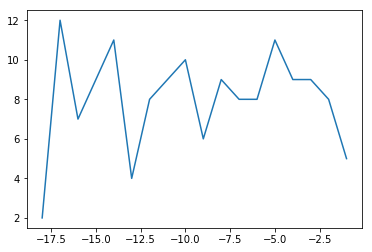

In [373]:
#aging_labels = np.array(target_data['aging'])
labels = np.array(target_data.index.values)
x_labels = np.arange(-len(labels),0)
trend_line = target_data['Quantity']
plt.plot(x_labels, trend_line)
plt.show()

In [295]:
target_data['InvoiceDate'].min()

Timestamp('2010-12-01 12:27:00')

In [296]:
target_data['InvoiceDate'].max()

Timestamp('2011-12-09 10:23:00')

In [308]:
min_target_data

datetime.date(2011, 11, 19)

In [395]:
trend_line[0]

2

In [396]:
trend_line[7-1::-1]

aging
7     8
5     4
4    11
3     9
2     7
1    12
0     2
Name: Quantity, dtype: int32

In [400]:
window_size=7
series=trend_line
ext = np.r_[2 * series[0] - series[window_size-1::-1], series,2 * series[1] - series[-1:-window_size:-1]]
print(ext)

[-4  0 -7 -5 -3 -8  2  2 12  7  9 11  4  8  9 10  6  9  8  8 11  9  9  8  5
 19 16 15 15 13 16]


In [ ]:
weights[0:window_size/2] = np.zeros(window_size/2)
print(win)

[ 0.08  0.31  0.77  1.    0.77  0.31  0.08]


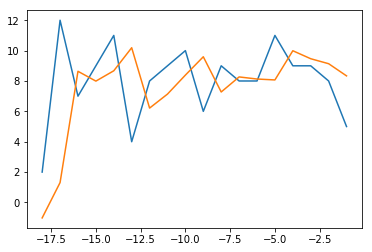

In [595]:
def smooth(series, window_size, window):

    # Generate data points 'outside' of x on either side to ensure
    # the smoothing window can operate everywhere
    ext = np.r_[2 * series[0] - series[window_size-1::-1], series,2 * series[1] - series[-1:-window_size:-1]]

    weights = window(window_size)
    print(weights)
    weights[0:int(round(window_size/2))] = np.zeros(int(round(window_size/2)))
    smoothed = np.convolve(weights / weights.sum(), ext, mode='same')
    return smoothed[window_size:-window_size+1]  # trim away the excess data

smoothed = smooth(trend_line, 7, np.hamming)
plt.plot(x_labels,trend_line)
plt.plot(x_labels, smoothed, label="Smoothed")

In [377]:
print (np.hamming(7))

[ 0.08  0.31  0.77  1.    0.77  0.31  0.08]


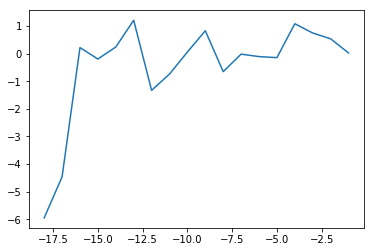

In [412]:
def standardize(series):
    iqr = np.percentile(series, 75) - np.percentile(series, 25)
    return (series - np.median(series)) / iqr

smoothed_std = standardize(smoothed)
plt.plot(x_labels, smoothed_std)

In [ ]:
target_data = data.loc[data['Description'] == target_product]
target_date = target_data['InvoiceDate'].max().date()
target_data['Date'] = target_data['InvoiceDate'].dt.date
min_target_data = target_date - timedelta(days=20)
target_data['target_date'] = target_date
target_data = target_data.loc[target_data['Date'] > min_target_data]
target_data['aging'] = (target_date - target_data['Date']).dt.days
target_data = target_data.groupby(by='aging').Quantity.sum().reset_index().fillna(0).set_index('aging')

In [416]:
target_data = data
target_date = target_data['InvoiceDate'].max().date()
target_data['Date'] = target_data['InvoiceDate'].dt.date
min_target_data = target_date - timedelta(days=20)
target_data['target_date'] = target_date
target_data = target_data.loc[target_data['Date'] > min_target_data]
target_data['aging'] = (target_date - target_data['Date']).dt.days
target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index().fillna(0).set_index(['Description','aging'])

C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [417]:
target_data

Quantity
Description                         aging          
 4 PURPLE FLOCK DINNER CANDLES      1             1
                                    2             2
                                    3             1
                                    4             1
                                    9             2
                                    12            1
                                    15            1
                                    17            1
                                    18            1
                                    19            3
 50'S CHRISTMAS GIFT BAG LARGE      0             3
                                    1             1
                                    2             2
                                    4             3
                                    5             1
                                    7             1
                                    8             2
                                    9             1
                                    10            3
                                    15            4
                                    16            3
                                    17            1
 DOLLY GIRL BEAKER                  0             1
                                    1             2
                                    2             1
                                    3             4
                                    4             2
                                    5             1
                                    7             3
                                    8             1
                                    9             2
                                    10            3
                                    11            1
                                    12            2
                                    14            4
                                    15            1
                                    16            2
                                    17            3
                                    18            1
                                    19            1
 I LOVE LONDON MINI BACKPACK        0             1
                                    1             2
                                    2             2
                                    3             1
                                    4             1
                                    8             1
                                    9             1
                                    11            1
                                    12            1
                                    14            3
                                    15            1
                                    16            2
                                    18            3
 NINE DRAWER OFFICE TIDY            2             1
                                    4             4
                                    8             1
                                    11            1
                                    14            1
                                    15            1
                                    17            1
 OVAL WALL MIRROR DIAMANTE          0             1
                                    1             2
                                    3             1
                                    4             1
                                    5             1
                                    7             1
                                    9             1
                                    11            1
                                    14            1
                                    15            1
                                    16            1
                                    17            1
                                    18            1
                                    19            1
 RED SPOT GIFT BAG LARGE            0             1
                                    1  

In [ ]:
SMOOTHING_WINDOW_FUNCTION = np.hamming
SMOOTHING_WINDOW_SIZE = 7

def train():
    #df = pd.read_csv('sample-cart-add-data.csv')
    #df.sort_values(by=['id', 'age'], inplace=True)
    #trends = pd.pivot_table(df, values='count', index=['id', 'age
    target_data = data
    target_date = target_data['InvoiceDate'].max().date()
    target_data['Date'] = target_data['InvoiceDate'].dt.date
    min_target_data = target_date - timedelta(days=20)
    target_data['target_date'] = target_date
    target_data = target_data.loc[target_data['Date'] > min_target_data]
    target_data['aging'] = (target_date - target_data['Date']).dt.days
    target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index().fillna(0).set_index(['Description','aging'])
    trends=target_data
    
    trend_snap = {}

    for i in np.unique(data['Description']):
        trend = np.array(trends[i])
        smoothed = smooth(trend, SMOOTHING_WINDOW_SIZE, SMOOTHING_WINDOW_FUNCTION)
        nsmoothed = standardize(smoothed)
        slopes = nsmoothed[1:] - nsmoothed[:-1]
        # I blend in the previous slope as well, to stabalize things a bit and
        # give a boost to things that have been trending for more than 1 day
        if len(slopes) > 1:
            trend_snap[i] = slopes[-1] + slopes[-2] * 0.5
    return sorted(trend_snap.items(), key=operator.itemgetter(1), reverse=True)

def smooth(series, window_size, window):

    # Generate data points 'outside' of x on either side to ensure
    # the smoothing window can operate everywhere
    ext = np.r_[2 * series[0] - series[window_size-1::-1], series,2 * series[1] - series[-1:-window_size:-1]]

    weights = window(window_size)
    print(weights)
    weights[0:int(round(window_size/2))] = np.zeros(int(round(window_size/2)))
    smoothed = np.convolve(weights / weights.sum(), ext, mode='same')
    return smoothed[window_size:-window_size+1]  # trim away the excess data


def standardize(series):
    iqr = np.percentile(series, 75) - np.percentile(series, 25)
    return (series - np.median(series)) / iqr


trending = train()
print ("Top 5 trending products:")
for i, s in trending[:5]:
    print ("Product %s (score: %2.2f)" % (i, s))

In [462]:
#target_data = data.loc[data['Description'] == target_product]
target_data = data
target_date = target_data['InvoiceDate'].max().date()
target_data['Date'] = target_data['InvoiceDate'].dt.date
min_target_data = target_date - timedelta(days=20)
target_data['target_date'] = target_date
target_data = target_data.loc[target_data['Date'] > min_target_data]
target_data['aging'] = (target_date - target_data['Date']).dt.days
target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index().fillna(0).set_index('aging')


C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


In [464]:
target_data.head(35)

,Description,Quantity
aging,,
1,4 PURPLE FLOCK DINNER CANDLES,1
2,4 PURPLE FLOCK DINNER CANDLES,2
3,4 PURPLE FLOCK DINNER CANDLES,1
4,4 PURPLE FLOCK DINNER CANDLES,1
9,4 PURPLE FLOCK DINNER CANDLES,2
12,4 PURPLE FLOCK DINNER CANDLES,1
15,4 PURPLE FLOCK DINNER CANDLES,1
17,4 PURPLE FLOCK DINNER CANDLES,1
18,4 PURPLE FLOCK DINNER CANDLES,1


In [482]:
target_data2 = target_data.loc[target_data['Description'] == ' DOLLY GIRL BEAKER']
#trend = np.array(target_data2[i])

In [484]:
x257 = np.array(target_data2['Quantity'])

In [485]:
x257

array([1, 2, 1, 4, 2, 1, 3, 1, 2, 3, 1, 2, 4, 1, 2, 3, 1, 1])

In [473]:
target_data2

,Description,Quantity
aging,,


In [443]:
cleaned_text[0]

'WHITE HANGING HEART T LIGHT HOLDER'

In [488]:
product_list = data.Description.unique()

In [490]:
product_list

array(['WHITE HANGING HEART T-LIGHT HOLDER', 'WHITE METAL LANTERN',
       'CREAM CUPID HEARTS COAT HANGER', ..., 'LETTER "U" BLING KEY RING',
       'CREAM HANGING HEART T-LIGHT HOLDER', 'PAPER CRAFT , LITTLE BIRDIE'], dtype=object)

In [520]:
    target_data = data
    target_date = target_data['InvoiceDate'].max().date()
    target_data['Date'] = target_data['InvoiceDate'].dt.date
    min_target_data = target_date - timedelta(days=20)
    target_data['target_date'] = target_date
    target_data = target_data.loc[target_data['Date'] > min_target_data]
    target_data['aging'] = (target_date - target_data['Date']).dt.days
    target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index().fillna(0)
    trends=target_data

C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  import sys


In [521]:
trends['Description']

0              4 PURPLE FLOCK DINNER CANDLES
1              4 PURPLE FLOCK DINNER CANDLES
2              4 PURPLE FLOCK DINNER CANDLES
3              4 PURPLE FLOCK DINNER CANDLES
4              4 PURPLE FLOCK DINNER CANDLES
5              4 PURPLE FLOCK DINNER CANDLES
6              4 PURPLE FLOCK DINNER CANDLES
7              4 PURPLE FLOCK DINNER CANDLES
8              4 PURPLE FLOCK DINNER CANDLES
9              4 PURPLE FLOCK DINNER CANDLES
10             50'S CHRISTMAS GIFT BAG LARGE
11             50'S CHRISTMAS GIFT BAG LARGE
12             50'S CHRISTMAS GIFT BAG LARGE
13             50'S CHRISTMAS GIFT BAG LARGE
14             50'S CHRISTMAS GIFT BAG LARGE
15             50'S CHRISTMAS GIFT BAG LARGE
16             50'S CHRISTMAS GIFT BAG LARGE
17             50'S CHRISTMAS GIFT BAG LARGE
18             50'S CHRISTMAS GIFT BAG LARGE
19             50'S CHRISTMAS GIFT BAG LARGE
20             50'S CHRISTMAS GIFT BAG LARGE
21             50'S CHRISTMAS GIFT BAG LARGE
22        

In [527]:
target_data2 = trends.loc[trends['Description'] == ' 4 PURPLE FLOCK DINNER CANDLES']
trend = np.array(target_data2['Quantity'])

In [528]:
target_data2

,Description,aging,Quantity
0,4 PURPLE FLOCK DINNER CANDLES,1,1
1,4 PURPLE FLOCK DINNER CANDLES,2,2
2,4 PURPLE FLOCK DINNER CANDLES,3,1
3,4 PURPLE FLOCK DINNER CANDLES,4,1
4,4 PURPLE FLOCK DINNER CANDLES,9,2
5,4 PURPLE FLOCK DINNER CANDLES,12,1
6,4 PURPLE FLOCK DINNER CANDLES,15,1
7,4 PURPLE FLOCK DINNER CANDLES,17,1
8,4 PURPLE FLOCK DINNER CANDLES,18,1
9,4 PURPLE FLOCK DINNER CANDLES,19,3


In [545]:
product_list[0:4]

array(['WHITE HANGING HEART T-LIGHT HOLDER', 'WHITE METAL LANTERN',
       'CREAM CUPID HEARTS COAT HANGER',
       'KNITTED UNION FLAG HOT WATER BOTTLE'], dtype=object)

In [622]:
data256 = data[10:52]


In [615]:
data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Day of Week,Week of Year,Month,Hour,Year,Day of Week Number,Date,target_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,1,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
1,536365,71053,WHITE METAL LANTERN,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,1,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09


In [618]:
data256.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Day of Week,Week of Year,Month,Hour,Year,Day of Week Number,Date,target_date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,1,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,15.30,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
1,536365,71053,WHITE METAL LANTERN,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,1,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,22.00,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,1,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,20.34,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09


In [630]:
idx = pd.date_range('09-01-2013', '09-30-2013')



In [631]:
s = pd.Series({'09-02-2013': 2,
               '09-03-2013': 10,
               '09-06-2013': 5,
               '09-07-2013': 1})


In [635]:
data256

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,Revenue,Day of Week,Week of Year,Month,Hour,Year,Day of Week Number,Date,target_date
10,536367,22745,POPPY'S PLAYHOUSE BEDROOM,1,2010-12-01 08:34:00,2.10,13047.0,United Kingdom,12.60,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
11,536367,22748,POPPY'S PLAYHOUSE KITCHEN,1,2010-12-01 08:34:00,2.10,13047.0,United Kingdom,12.60,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
12,536367,22749,FELTCRAFT PRINCESS CHARLOTTE DOLL,1,2010-12-01 08:34:00,3.75,13047.0,United Kingdom,30.00,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
13,536367,22310,IVORY KNITTED MUG COSY,1,2010-12-01 08:34:00,1.65,13047.0,United Kingdom,9.90,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
14,536367,84969,BOX OF 6 ASSORTED COLOUR TEASPOONS,1,2010-12-01 08:34:00,4.25,13047.0,United Kingdom,25.50,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
15,536367,22623,BOX OF VINTAGE JIGSAW BLOCKS,1,2010-12-01 08:34:00,4.95,13047.0,United Kingdom,14.85,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
16,536367,22622,BOX OF VINTAGE ALPHABET BLOCKS,1,2010-12-01 08:34:00,9.95,13047.0,United Kingdom,19.90,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
17,536367,21754,HOME BUILDING BLOCK WORD,1,2010-12-01 08:34:00,5.95,13047.0,United Kingdom,17.85,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
18,536367,21755,LOVE BUILDING BLOCK WORD,1,2010-12-01 08:34:00,5.95,13047.0,United Kingdom,17.85,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09
19,536367,21777,RECIPE BOX WITH METAL HEART,1,2010-12-01 08:34:00,7.95,13047.0,United Kingdom,31.80,Wednesday,48,12,8,2010,2,2010-12-01,2011-12-09


In [632]:
s.index = pd.DatetimeIndex(s.index)



In [633]:
s = s.reindex(idx, fill_value=0)


In [634]:
print(s)

2013-09-01     0
2013-09-02     2
2013-09-03    10
2013-09-04     0
2013-09-05     0
2013-09-06     5
2013-09-07     1
2013-09-08     0
2013-09-09     0
2013-09-10     0
2013-09-11     0
2013-09-12     0
2013-09-13     0
2013-09-14     0
2013-09-15     0
2013-09-16     0
2013-09-17     0
2013-09-18     0
2013-09-19     0
2013-09-20     0
2013-09-21     0
2013-09-22     0
2013-09-23     0
2013-09-24     0
2013-09-25     0
2013-09-26     0
2013-09-27     0
2013-09-28     0
2013-09-29     0
2013-09-30     0
Freq: D, dtype: int64


In [701]:
# Test2

SMOOTHING_WINDOW_FUNCTION = np.hamming
SMOOTHING_WINDOW_SIZE = 7

def train():
    #df = pd.read_csv('sample-cart-add-data.csv')
    #df.sort_values(by=['id', 'age'], inplace=True)
    #trends = pd.pivot_table(df, values='count', index=['id', 'age
    target_data = data
    target_date = target_data['InvoiceDate'].max().date()
    target_date = target_date - timedelta(days=25)
    target_data['Date'] = target_data['InvoiceDate'].dt.date
    min_target_data = target_date - timedelta(days=20)
    target_data['target_date'] = target_date
    target_data = target_data.loc[target_data['Date'] > min_target_data]
    target_data['aging'] = (target_date - target_data['Date']).dt.days
    target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index()
    trends=target_data
    
    
    trend_snap = {}
    

    for i in product_list:
        target_data2 = trends.loc[trends['Description'] == i]

        target_data2 = target_data2[["aging","Quantity"]].reset_index().set_index('aging')
        len_fix = range(0,20)
        target_data2 = target_data2.reindex(len_fix,fill_value=1)


        trend = np.array(target_data2['Quantity'])
        #print(trend)
        trend = trend[::-1]
        #print(trend)
        
        smoothed = smooth(trend, SMOOTHING_WINDOW_SIZE, SMOOTHING_WINDOW_FUNCTION)
        
        nsmoothed = standardize(smoothed)
        
        slopes = nsmoothed[1:] - nsmoothed[:-1]
        

        # I blend in the previous slope as well, to stabalize things a bit and
        # give a boost to things that have been trending for more than 1 day
        if len(slopes) > 1:
            trend_snap[i] = slopes[-1] + slopes[-2] * 0.5
            
    return sorted(trend_snap.items(), key=operator.itemgetter(1), reverse=True)
   

def smooth(series, window_size, window):

    # Generate data points 'outside' of x on either side to ensure
    # the smoothing window can operate everywhere
    ext = np.r_[2 * series[0] - series[window_size-1::-1], series,2 * series[-1] - series[-1:-window_size:-1]]
    #ext = ext[: , 0]
    weights = window(window_size)
    smoothed = np.convolve(weights / weights.sum(), ext, mode='same')
    return smoothed[window_size:-window_size+1]


def standardize(series):
    iqr = np.percentile(series, 75) - np.percentile(series, 25)
    return (series - np.median(series)) / iqr


trending = train()
print(type(trending))
print ("Top 5 trending products:")
for i, s in trending[:5]:
    print ("Product %s (score: %2.2f)" % (i, s))

C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:17: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: RuntimeWarning: invalid value encountered in true_divide
C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:66: RuntimeWarning: divide by zero encountered in true_divide
C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:42: RuntimeWarning: invalid value encountered in subtract


<class 'list'>
Top 5 trending products:
Product GLASS STAR FROSTED T-LIGHT HOLDER (score: 7.08)
Product SET 7 BABUSHKA NESTING BOXES (score: 4.96)
Product HAND WARMER RED POLKA DOT (score: nan)
Product FELTCRAFT PRINCESS CHARLOTTE DOLL (score: 2.44)
Product RED WOOLLY HOTTIE WHITE HEART. (score: 1.94)


In [684]:
t2 = sorted(trending, key=lambda tup: tup[1])

In [692]:
from operator import itemgetter
t2 = t2.sort(key=lambda tup: tup[1], reverse=True)

AttributeError: 'NoneType' object has no attribute 'sort'

In [705]:
t2 = trending
t2 = [i for i in t2 if i[1] > 0]
t2.sort(key = operator.itemgetter(1), reverse = True)

In [706]:
t2

[('RED RETROSPOT CHILDRENS UMBRELLA', 154.25000000000091),
 ('PAPER BUNTING VINTAGE PARTY', 154.25000000000091),
 ('36 FOIL HEART CAKE CASES', 67.500000000000426),
 ('PENS ASSORTED SPACEBALL', 16.86458333333335),
 ('ACRYLIC HANGING JEWEL,BLUE', 10.766233766233757),
 ('SET 36 COLOURING PENCILS DOILY', 8.6334661354581517),
 ('PAPER BUNTING WHITE LACE', 7.5044247787610585),
 ('GLASS STAR FROSTED T-LIGHT HOLDER', 7.0823529411764614),
 ('COLUMBIAN CANDLE ROUND', 6.9632107023411276),
 ('CHARLIE+LOLA MY ROOM DOOR SIGN', 6.7077922077922016),
 ('PLAYING CARDS I LOVE LONDON ', 6.3607361963190208),
 ('SET OF 2 ROUND TINS DUTCH CHEESE', 5.8988764044943824),
 ('CHILDS BREAKFAST SET DOLLY GIRL ', 5.6996996996996989),
 ('CHARLIE & LOLA WASTEPAPER BIN FLORA', 5.5962145110410013),
 ('S/4 PINK FLOWER CANDLES IN BOWL', 5.3036437246963537),
 ('GLITTER CHRISTMAS STAR ', 5.2686804451510358),
 ('FAIRY TALE COTTAGE NIGHT LIGHT', 5.0727762803234437),
 ('SET 7 BABUSHKA NESTING BOXES', 4.9571428571428511),
 ('FE

In [704]:
t2 = trending
t2 = [i for i in in_tup if i[0] >= 50]
t2.sort(key = operator.itemgetter(1), reverse = True)

[('GLASS STAR FROSTED T-LIGHT HOLDER', 7.0823529411764614),
 ('SET 7 BABUSHKA NESTING BOXES', 4.9571428571428511),
 ('FELTCRAFT PRINCESS CHARLOTTE DOLL', 2.4355345911949691),
 ('RED WOOLLY HOTTIE WHITE HEART.', 1.9448888888888898),
 ("POPPY'S PLAYHOUSE BEDROOM ", 1.7275204359673038),
 ('ALARM CLOCK BAKELIKE GREEN', 1.0593485051316383),
 ('RED TOADSTOOL LED NIGHT LIGHT', 2.4797479747974789),
 ('JAM MAKING SET WITH JARS', 1.5345911949685536),
 ('ASSORTED COLOUR BIRD ORNAMENT', 1.3566009104704104),
 ("POPPY'S PLAYHOUSE KITCHEN", 1.3281249999999991),
 ('VINTAGE HEADS AND TAILS CARD GAME ', 0.86956521739130455),
 ('BOX OF VINTAGE JIGSAW BLOCKS ', 0.85987261146496852),
 ('ALARM CLOCK BAKELIKE RED ', 0.78044444444444472),
 ('ROUND SNACK BOXES SET OF4 WOODLAND ', 0.74397590361445798),
 ('CERAMIC STRAWBERRY CAKE MONEY BANK', 0.73684210526315819),
 ('DOORMAT NEW ENGLAND', 0.73596673596673623),
 ('WHITE HANGING HEART T-LIGHT HOLDER', 0.53848809112875451),
 ('WHITE METAL LANTERN', 0.43178807947019

In [700]:
print(t2)

[('GLASS STAR FROSTED T-LIGHT HOLDER', nan), ('HAND WARMER RED POLKA DOT', nan), ('JAZZ HEARTS ADDRESS BOOK', 2.8724489795918351), ('CIRCUS PARADE LUNCH BOX ', 2.5144927536231862), ('ASSORTED COLOUR BIRD ORNAMENT', 1.5005096839959227), ('STARS GIFT TAPE ', 1.3670886075949342), ('FELTCRAFT PRINCESS CHARLOTTE DOLL', 1.2772133526850504), ('CHARLOTTE BAG DOLLY GIRL DESIGN', 0.50295857988165593), ('BOX OF 6 ASSORTED COLOUR TEASPOONS', 0.0), ('VINTAGE SEASIDE JIGSAW PUZZLES', 0.0), ('MINI JIGSAW CIRCUS PARADE ', 0.0), ('VINTAGE BILLBOARD LOVE/HATE MUG', 0.0), ('VICTORIAN SEWING BOX LARGE', 0.0), ('RED DRAWER KNOB ACRYLIC EDWARDIAN', 0.0), ('BLUE DRAWER KNOB ACRYLIC EDWARDIAN', 0.0), ('LOVE BUILDING BLOCK WORD', -0.20916030534351171), ('ASSORTED COLOUR MINI CASES', -0.22272215973003434), ('TRIPLE PHOTO FRAME CORNICE ', -0.23564954682779485), ('TV DINNER TRAY VINTAGE PAISLEY', -0.25324675324675389), ('BALLOONS  WRITING SET ', -0.27206645898234705), ('FAMILY PHOTO FRAME CORNICE', -0.31042654028

In [685]:
trending

[('GLASS STAR FROSTED T-LIGHT HOLDER', nan),
 ('HAND WARMER RED POLKA DOT', nan),
 ('CIRCUS PARADE LUNCH BOX ', 2.5144927536231862),
 ('ASSORTED COLOUR BIRD ORNAMENT', 1.5005096839959227),
 ('FELTCRAFT PRINCESS CHARLOTTE DOLL', 1.2772133526850504),
 ('CHARLOTTE BAG DOLLY GIRL DESIGN', 0.50295857988165593),
 ("POPPY'S PLAYHOUSE KITCHEN", 0.50246305418719217),
 ("POPPY'S PLAYHOUSE BEDROOM ", 0.45538057742782145),
 ('HAND WARMER UNION JACK', 0.34866163349347973),
 ('WHITE HANGING HEART T-LIGHT HOLDER', -1.544015825914935),
 ('WHITE METAL LANTERN', -1.924999999999994),
 ('IVORY KNITTED MUG COSY ', nan),
 ('BOX OF 6 ASSORTED COLOUR TEASPOONS', 0.0),
 ('LOVE BUILDING BLOCK WORD', -0.20916030534351171),
 ('HOME BUILDING BLOCK WORD', -0.56749785038692979),
 ('SET 7 BABUSHKA NESTING BOXES', -0.65631067961164979),
 ('RED WOOLLY HOTTIE WHITE HEART.', -0.92635423006695095),
 ('KNITTED UNION FLAG HOT WATER BOTTLE', -1.2298006295907653),
 ('CREAM CUPID HEARTS COAT HANGER', -3.3454545454545412),
 ('R

In [610]:
SMOOTHING_WINDOW_FUNCTION = np.hamming
SMOOTHING_WINDOW_SIZE = 7

def train():
    #df = pd.read_csv('sample-cart-add-data.csv')
    #df.sort_values(by=['id', 'age'], inplace=True)
    #trends = pd.pivot_table(df, values='count', index=['id', 'age
    target_data = data
    target_date = target_data['InvoiceDate'].max().date()
    target_data['Date'] = target_data['InvoiceDate'].dt.date
    min_target_data = target_date - timedelta(days=20)
    target_data['target_date'] = target_date
    target_data = target_data.loc[target_data['Date'] > min_target_data]
    target_data['aging'] = (target_date - target_data['Date']).dt.days
    target_data = target_data.groupby(by=['Description','aging']).Quantity.sum().reset_index()
    trends=target_data
    #print(trends)
    
    trend_snap = {}
    

    for i in product_list:
        target_data2 = trends.loc[trends['Description'] == i]
        trend = np.array(target_data2['Quantity'])
        smoothed = smooth(trend, SMOOTHING_WINDOW_SIZE, SMOOTHING_WINDOW_FUNCTION)
        nsmoothed = standardize(smoothed)
        slopes = nsmoothed[1:] - nsmoothed[:-1]

        # I blend in the previous slope as well, to stabalize things a bit and
        # give a boost to things that have been trending for more than 1 day
        if len(slopes) > 1:
            trend_snap[i] = slopes[-1] + slopes[-2] * 0.5
    return sorted(trend_snap.items(), key=operator.itemgetter(1), reverse=True)
   

def smooth(series, window_size, window):

    # Generate data points 'outside' of x on either side to ensure
    # the smoothing window can operate everywhere
    ext = np.r_[2 * series[0] - series[window_size-1::-1], series, 2 * series[-1] - series[-1:-window_size:-1]]

    #ext = ext[: , 0]
    weights = window(window_size)
    smoothed = np.convolve(weights / weights.sum(), ext, mode='same')
    return smoothed[window_size:-window_size+1]


def standardize(series):
    iqr = np.percentile(series, 75) - np.percentile(series, 25)
    return (series - np.median(series)) / iqr


trending = train()
#print ("Top 5 trending products:")
#for i, s in trending[:5]:
#    print ("Product %s (score: %2.2f)" % (i, s))

C:\Users\shaba\Anaconda3\lib\site-packages\ipykernel_launcher.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


IndexError: index 0 is out of bounds for axis 0 with size 0

In [ ]:
target_data[' 4 PURPLE FLOCK DINNER CANDLES']

In [424]:
target_data.head()

Quantity
Description                    aging          
 4 PURPLE FLOCK DINNER CANDLES 1             1
                               2             2
                               3             1
                               4             1
                               9             2

In [433]:
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [435]:
df = pd.read_csv(r'C:\Users\shaba\Online Retail.csv')
df.sort_values(by=['Description','StockCode'], inplace=True)
trends2=pd.pivot_table(df, values='Quantity', index=['Description','StockCode'])

In [442]:
x256=np.array(trends2.loc[trends2['Description'] =='4 PURPLE FLOCK DINNER CANDLES'])

KeyError: 'Description'

In [436]:
trends2.head()

,,Quantity
Description,StockCode,
4 PURPLE FLOCK DINNER CANDLES,72800B,3.512195
50'S CHRISTMAS GIFT BAG LARGE,23437,14.715385
DOLLY GIRL BEAKER,23345,13.524862
I LOVE LONDON MINI BACKPACK,23391,4.420455
I LOVE LONDON MINI RUCKSACK,23391,1.000000


In [438]:
xlist = np.unique(df['Description'])

TypeError: '<' not supported between instances of 'float' and 'str'

In [427]:
cleaned_text

0          WHITE HANGING HEART T LIGHT HOLDER
1                         WHITE METAL LANTERN
2              CREAM CUPID HEARTS COAT HANGER
3         KNITTED UNION FLAG HOT WATER BOTTLE
4               RED WOOLLY HOTTIE WHITE HEART
5                SET 7 BABUSHKA NESTING BOXES
6           GLASS STAR FROSTED T LIGHT HOLDER
7                      HAND WARMER UNION JACK
8                   HAND WARMER RED POLKA DOT
9               ASSORTED COLOUR BIRD ORNAMENT
10                  POPPYS PLAYHOUSE BEDROOM 
11                   POPPYS PLAYHOUSE KITCHEN
12          FELTCRAFT PRINCESS CHARLOTTE DOLL
13                    IVORY KNITTED MUG COSY 
14         BOX OF 6 ASSORTED COLOUR TEASPOONS
15              BOX OF VINTAGE JIGSAW BLOCKS 
16             BOX OF VINTAGE ALPHABET BLOCKS
17                   HOME BUILDING BLOCK WORD
18                   LOVE BUILDING BLOCK WORD
19                RECIPE BOX WITH METAL HEART
20                        DOORMAT NEW ENGLAND
21                   JAM MAKING SE

In [426]:
target_data[0]

KeyError: 0